In [48]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json

In [49]:
user = "green"
source = f'data/{user}/{user}_chunks/'
save_path = f'data/{user}/'

In [61]:
with open(f'{source}{user}_test_acc10.json', 'r') as f:
        data_all = json.load(f)

In [62]:
with open(f'{source}{user}_test_acc12.json', 'r') as f:
        data_rh = json.load(f)

In [4]:
# run if the first file
data_all = data_all['rawAccelerometer'][0]
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'rawAccelerometer'

In [5]:
# run if cont
values = data_all["cont"]

t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'cont'

In [63]:
# Run if a new user but not the first acc
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

green_LHand


In [90]:
watch_pos = data_rh['firstName']
print(watch_pos)
values_rh = data_rh['values']
t_rh = [i['t'] for i in values_rh]
offset_rh = [i['offset'] for i in values_rh]

green_RHand


In [91]:
acc_x = [part['x'] for i in values for part in i['samples']]
acc_y = [part['y'] for i in values for part in i['samples']]
acc_z = [part['z'] for i in values for part in i['samples']]


In [92]:
acc_x_rh = [part['x'] for i in values_rh for part in i['samples']]
acc_y_rh = [part['y'] for i in values_rh for part in i['samples']]
acc_z_rh = [part['z'] for i in values_rh for part in i['samples']]


In [93]:
butterfly_25_shortened = np.load('butterfly_25_shortened.npy')
full_lap_butterfly_x = butterfly_25_shortened[0]
full_lap_butterfly_y = butterfly_25_shortened[1]
full_lap_butterfly_z = butterfly_25_shortened[2]


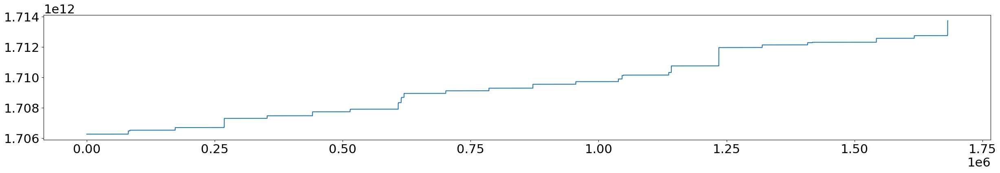

In [94]:
# Seeing how many days of data we have
# t_all is all the samples: freq*t
# This is because of data type is we have every second 
# and 25 samples for each second
second = t[1] - t[0]
freq = 25.0
period = second / freq
t_all = []
for sec in t:
    subsec = np.arange(sec, sec + second, period)
    for s in subsec:
        t_all.append(s)
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all)

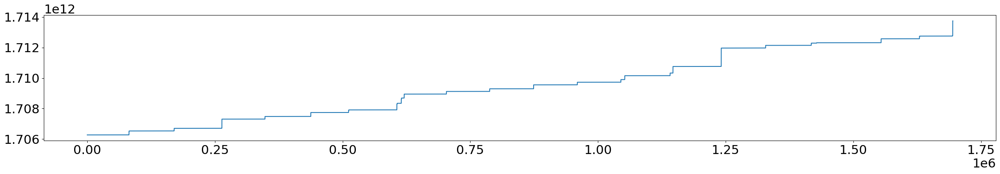

In [95]:
second = t[1] - t[0]
freq = 25.0
period = second / freq
t_allrh = []
for sec in t_rh:
    subsec = np.arange(sec, sec + second, period)
    for s in subsec:
        t_allrh.append(s)
fig = plt.figure(figsize=(30, 4))
plt.plot(t_allrh)

In [89]:
t_all == t_allrh

True

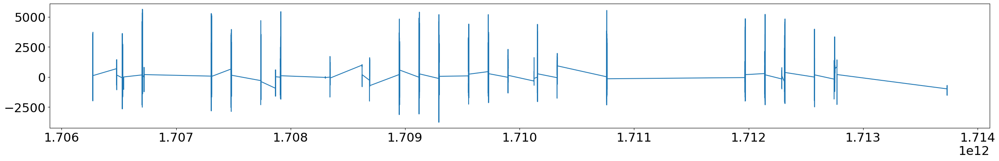

In [81]:
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all, acc_x)

In [96]:
# Using datetime to change t to 
# dates and use that figure out which days
# data collection happened
from datetime import datetime, timedelta, date
import time
timestamp = time.time()
date_object = datetime.fromtimestamp(timestamp)
print("Datetime:", date_object.date())
# make a list of datetime objects showing all days data collection happened: swimming_days
current_day = date(2024, 1, 29)
swimming_days = []
finish_day = date(2024, 4, 10)
while current_day < finish_day:
    swimming_days.append(current_day)
    if current_day.weekday() == 0 or current_day.weekday() == 2:
        current_day += timedelta(days=2)
    elif current_day.weekday() == 4:
        current_day += timedelta(days=3)
    else:
        print(f'error, date {current_day} and weekday:{current_day.weekday()}')
print(f'we have {len(swimming_days)} days of swimming data')

Datetime: 2025-01-31
we have 31 days of swimming data


In [97]:
def find_indices(t_all, swimming_days):
    
    # Finding the indices of the swimming dates
    data_dates_set = set()
    # indices are index of start of a swimming day that we have data for
    indices = []
    not_swimmed_i = []
    # we might have data on days swimming not happened
    # i might've turned the watch on for some reason
    # all dates i : all the indices on the begining of the day
    # the watch collected any form of data
    all_dates_i = []
    swimming_dates_date = []
    i = 0
    for t in t_all:
        # for each t in times that swimming happened, find the date
        date_object = datetime.fromtimestamp(t/1000.0)
        # as long as there's a date to add
        tmplen = len(data_dates_set)
        data_dates_set.add(date_object.date())

        if len(data_dates_set) > tmplen:
            if date_object.date() in swimming_days:
                indices.append(i)
            else:
                not_swimmed_i.append(i)
            all_dates_i.append(i)
        i += 1
    print(f'we have at most {len(indices)} days of swimming in this batch')
    return all_dates_i, indices



In [98]:
all_dates_i, indices = find_indices(t_all, swimming_days)

we have at most 21 days of swimming in this batch


In [99]:
all_dates_irh, indicesrh = find_indices(t_allrh, swimming_days)

we have at most 21 days of swimming in this batch


In [12]:
# # plotting all dates of available data in this batch of data
# for i in range(len(all_dates_i)):
#     if i < (len(all_dates_i) - 1):
#         if all_dates_i[i] in indices:
#             date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
#             fig = plt.figure(figsize=(30, 6))
#             plt.plot(acc_x[all_dates_i[i]:all_dates_i[i+1]])
#             plt.title(f'{date_object.date()} and i={i}')
#     else:
#         if all_dates_i[i] in indices:
#             date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
#             fig = plt.figure(figsize=(30, 6))
#             plt.plot(acc_x[all_dates_i[i]:])
#             plt.title(f'{date_object.date()} and i={i}')
        
        

date is 2024-01-29 and index is 84150, i=2
date is 2024-01-31 and index is 172750, i=3
date is 2024-02-07 and index is 268625, i=4
date is 2024-02-09 and index is 352375, i=5
date is 2024-02-12 and index is 441050, i=6
date is 2024-02-14 and index is 514950, i=8
date is 2024-02-19 and index is 608850, i=10
date is 2024-02-23 and index is 614825, i=12
date is 2024-02-26 and index is 619825, i=13
date is 2024-02-28 and index is 701450, i=14
date is 2024-03-01 and index is 785725, i=15
date is 2024-03-04 and index is 871650, i=16
date is 2024-03-06 and index is 955500, i=17
date is 2024-03-08 and index is 1038675, i=18
date is 2024-03-11 and index is 1048300, i=20
date is 2024-03-13 and index is 1137000, i=21
date is 2024-03-18 and index is 1142100, i=22
date is 2024-04-01 and index is 1234925, i=23
date is 2024-04-03 and index is 1319750, i=24
date is 2024-04-05 and index is 1417600, i=26
date is 2024-04-08 and index is 1542775, i=27


/tmp/ipykernel_10561/1035419412.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 6))


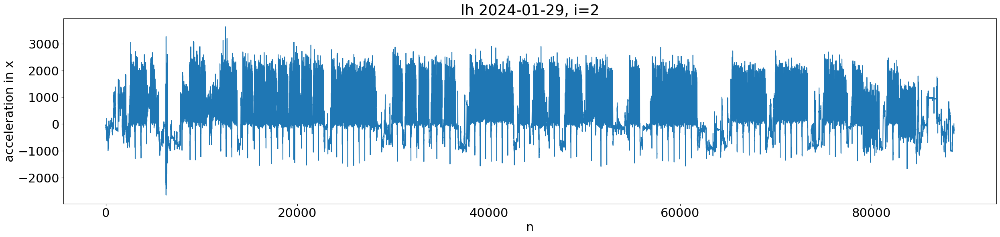

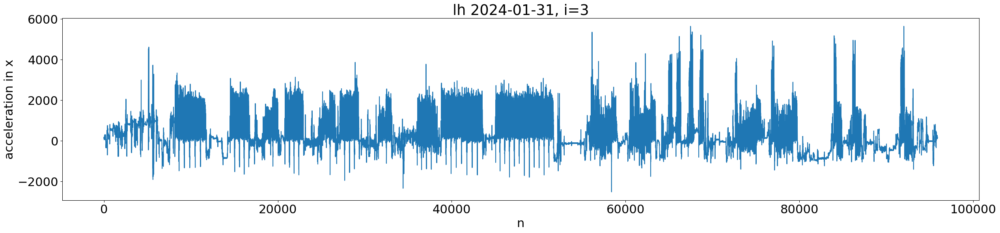

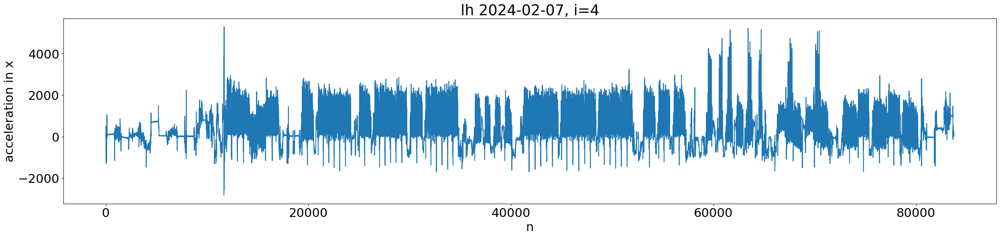

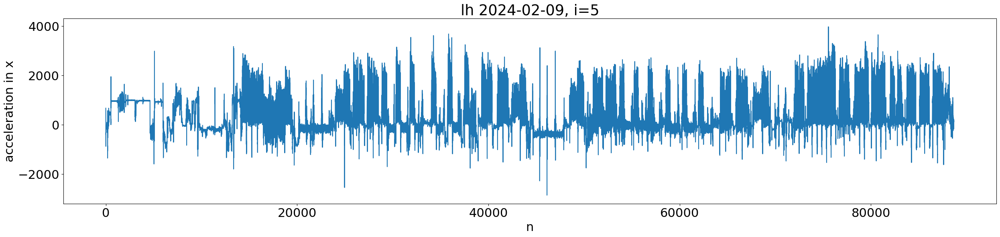

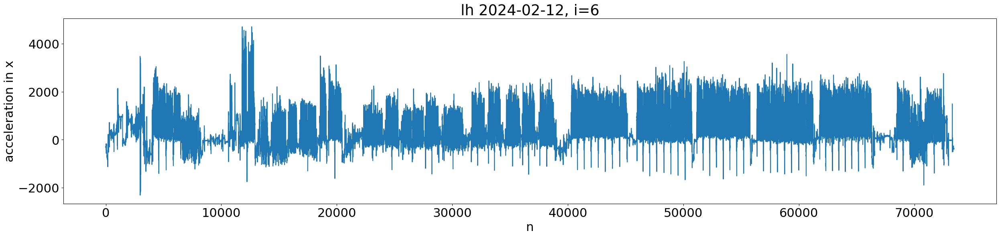

...

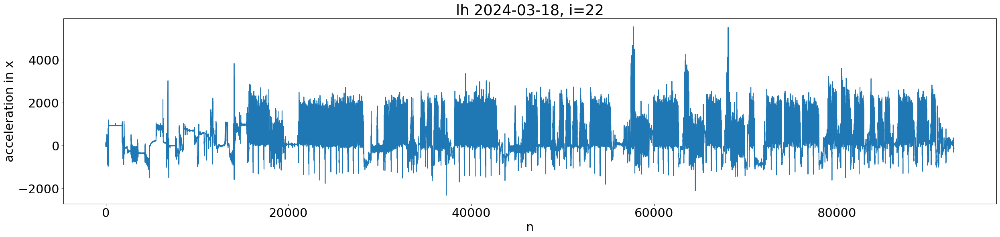

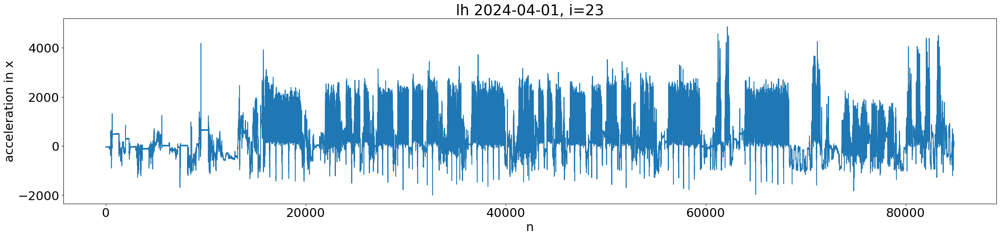

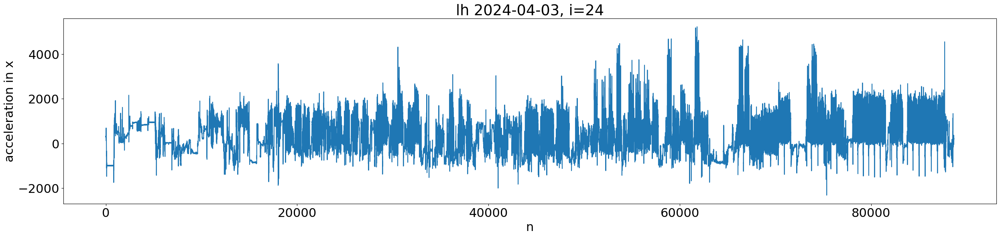

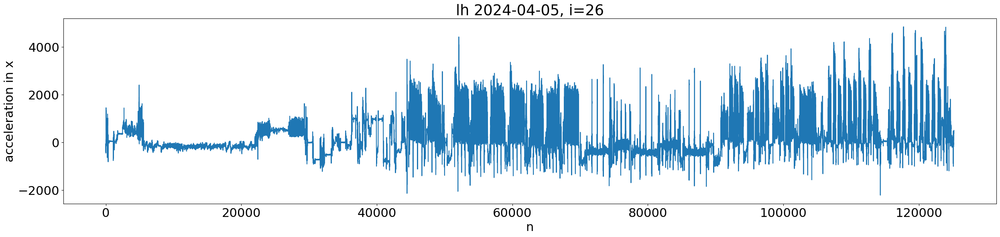

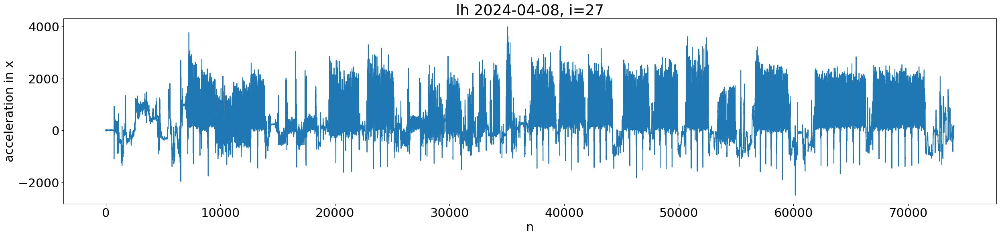

In [100]:
plt.rcParams.update({'font.size': 22})
for i in range(len(all_dates_i)):
    if i < (len(all_dates_i) - 1):
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:all_dates_i[i+1]])
            plt.title(f'lh {date_object.date()}, i={i}')
            plt.ylabel("acceleration in x")
            plt.xlabel("n")
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}, i={i}')
    else:
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:])
            plt.ylabel("acceleration in x")
            plt.xlabel("n")
            plt.title(f'lh {date_object.date()}, i={i}')
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}')

date is 2024-01-29 and index is 81900, i=2
date is 2024-01-31 and index is 170150, i=3
date is 2024-02-07 and index is 263625, i=4
date is 2024-02-09 and index is 347975, i=5
date is 2024-02-12 and index is 437700, i=6
date is 2024-02-14 and index is 512000, i=8
date is 2024-02-19 and index is 606875, i=10
date is 2024-02-23 and index is 615275, i=12
date is 2024-02-26 and index is 620475, i=13
date is 2024-02-28 and index is 703175, i=14
date is 2024-03-01 and index is 787875, i=15
date is 2024-03-04 and index is 873900, i=16
date is 2024-03-06 and index is 959500, i=17
date is 2024-03-08 and index is 1044775, i=18
date is 2024-03-11 and index is 1052375, i=19
date is 2024-03-13 and index is 1141150, i=20
date is 2024-03-18 and index is 1146750, i=21
date is 2024-04-01 and index is 1241225, i=22
date is 2024-04-03 and index is 1328150, i=23
date is 2024-04-05 and index is 1428050, i=25
date is 2024-04-08 and index is 1554250, i=26


/tmp/ipykernel_10561/3327507331.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 6))


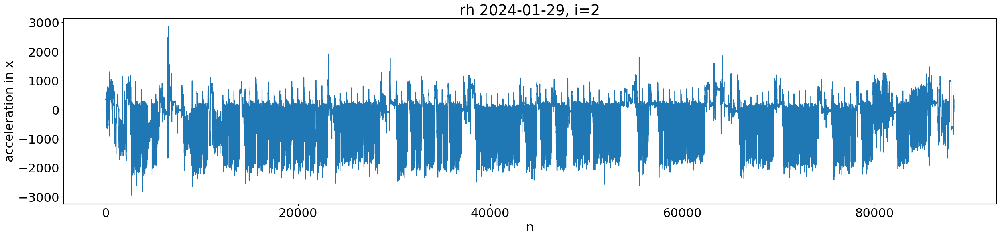

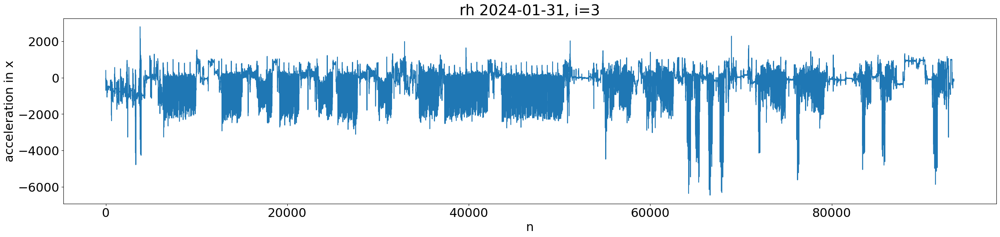

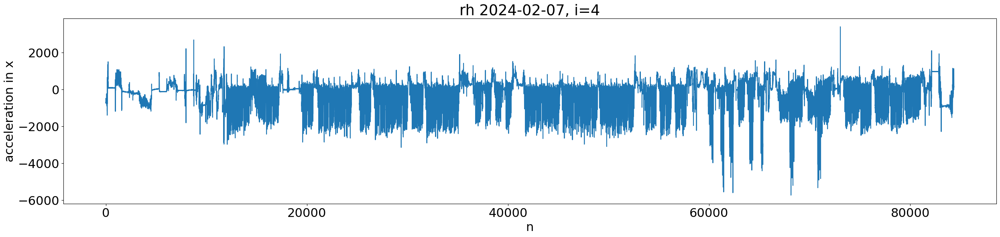

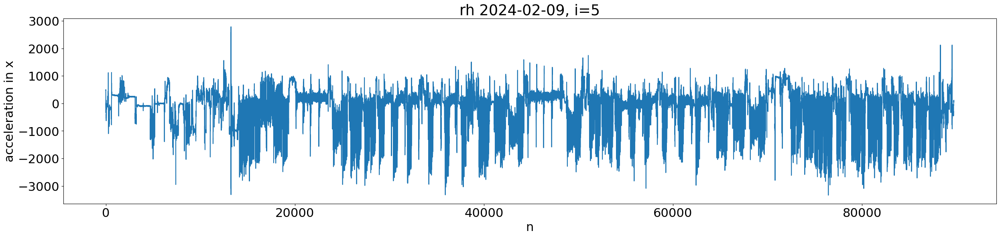

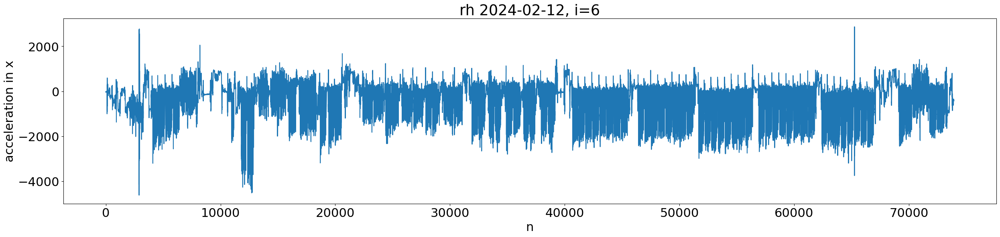

...

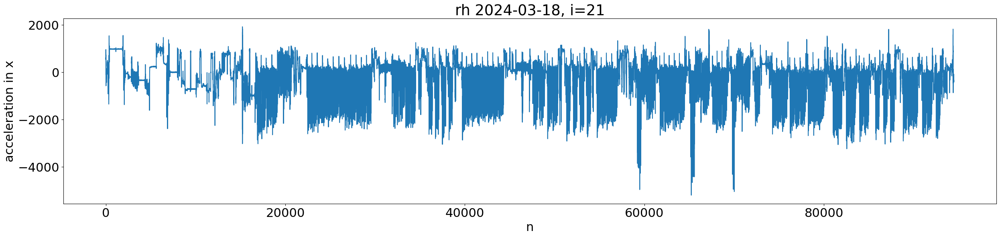

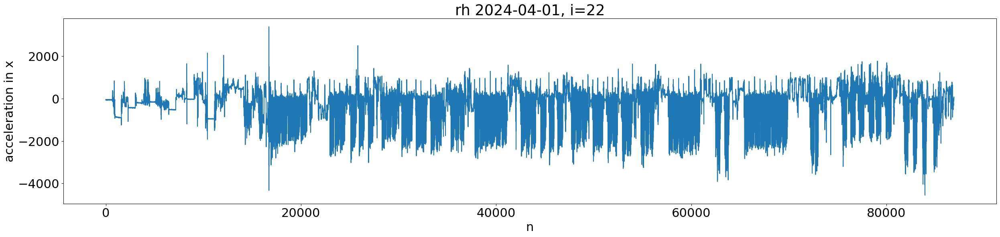

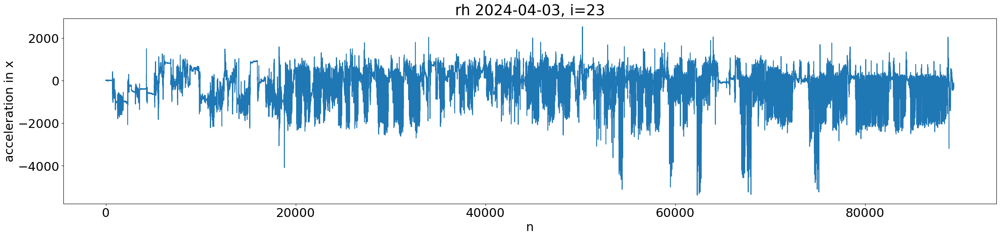

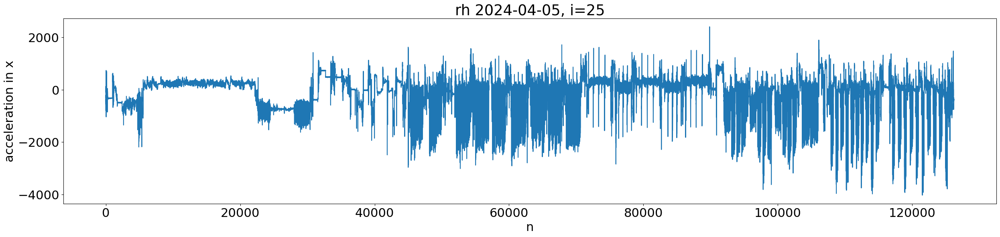

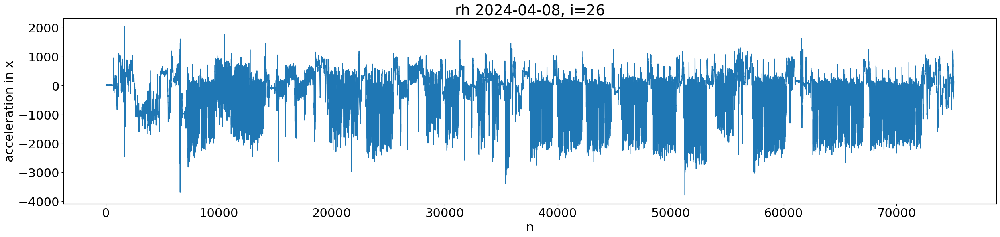

In [101]:
plt.rcParams.update({'font.size': 22})
for i in range(len(all_dates_irh)):
    if i < (len(all_dates_irh) - 1):
        if all_dates_irh[i] in indicesrh:
            date_object = datetime.fromtimestamp(t_allrh[all_dates_irh[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x_rh[all_dates_irh[i]:all_dates_irh[i+1]])
            plt.title(f'rh {date_object.date()}, i={i}')
            plt.ylabel("acceleration in x")
            plt.xlabel("n")
            print(f'date is {date_object.date()} and index is {all_dates_irh[i]}, i={i}')
    else:
        if all_dates_irh[i] in indicesrh:
            date_object = datetime.fromtimestamp(t_allrh[all_dates_irh[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x_rh[all_dates_irh[i]:])
            plt.ylabel("acceleration in x")
            plt.xlabel("n")
            plt.title(f'rh {date_object.date()}, i={i}')
            print(f'date is {date_object.date()} and index is {all_dates_irh[i]}')

In [102]:
# greenLH - GreenRH, indices at the start of day 31 of jan

ind_diff = all_dates_i[3] - all_dates_irh[3]
print(f'lefthand - righthand = {ind_diff}')
second_diff = ind_diff/25
print(f'difference in seconds: {second_diff}, equal to {second_diff/60} minutes')

lefthand - righthand = 2600
difference in seconds: 104.0, equal to 1.7333333333333334 minutes


In [103]:
# I choose date: Jan 31 because it had quite a few
# Butterfly sets
index = 3

2024-01-31 06:01:20
len of rh data:93475 and len of lh:95875
difference in length is:2400


Text(0, 0.5, 'acceleration in z')

<Figure size 3000x1000 with 0 Axes>

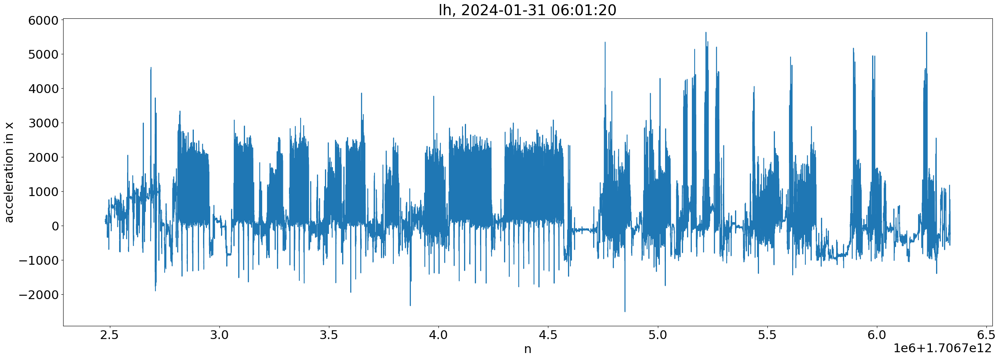

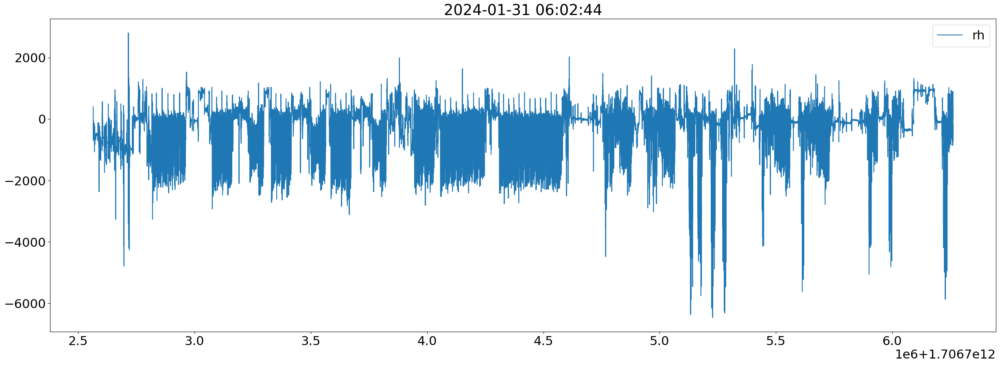

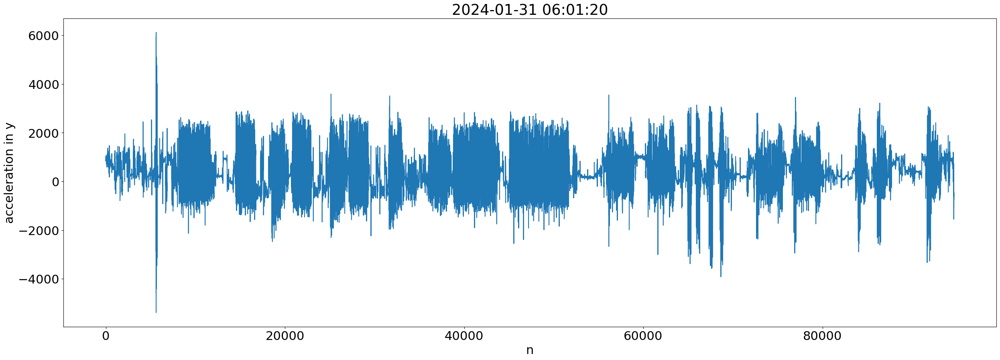

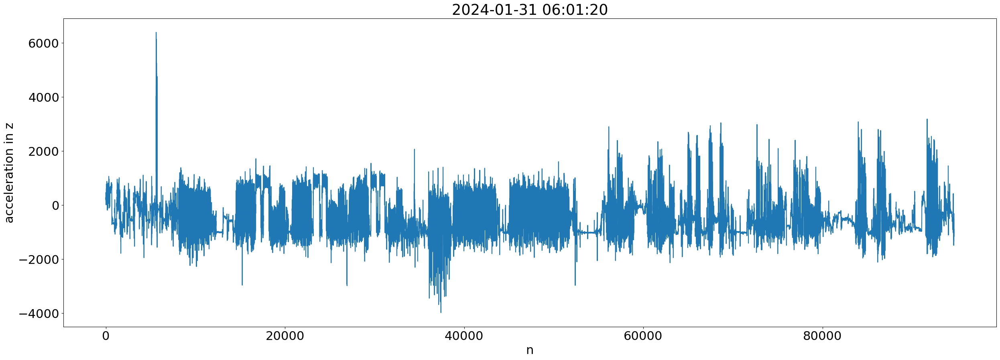

In [134]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
date_objectrh = datetime.fromtimestamp(t_allrh[all_dates_irh[index]]/1000.0)
print(date_object)
t_ = np.array(t_all[all_dates_i[index]:all_dates_i[index+1]])
t_rh_ = np.array(t_allrh[all_dates_irh[index]:all_dates_irh[index+1]])
z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
zrh = np.array(acc_z_rh[all_dates_irh[index]:all_dates_irh[index+1]])
yrh = np.array(acc_y_rh[all_dates_irh[index]:all_dates_irh[index+1]])
xrh = np.array(acc_x_rh[all_dates_irh[index]:all_dates_irh[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
# full_lap_butterfly_x = x[20100:20800]
# full_lap_butterfly_y = y[20100:20800]
# full_lap_butterfly_z = z[20100:20800]
start = 0
end = -1200
exp_x = x[ind_diff:]
exp_xrh = xrh[:-200]

print(f'len of rh data:{len(xrh)} and len of lh:{len(x)}')
print(f'difference in length is:{len(x)-len(xrh)}')
fig = plt.figure(figsize=(30, 10))
plt.plot(t_[:end], x[:end], label='lh')

plt.title(f"lh, {date_object}")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30, 10))
plt.plot(t_rh_[:end], xrh[:end], label=f"rh")
plt.title(f"{date_objectrh}")
plt.legend()
# plt.xlabel("n")
# plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title(f"{date_object}")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")
fig = plt.figure(figsize=(30,10))
plt.plot(z[start:end])
plt.title(f"{date_object}")
plt.xlabel("n")
plt.ylabel("acceleration in z")

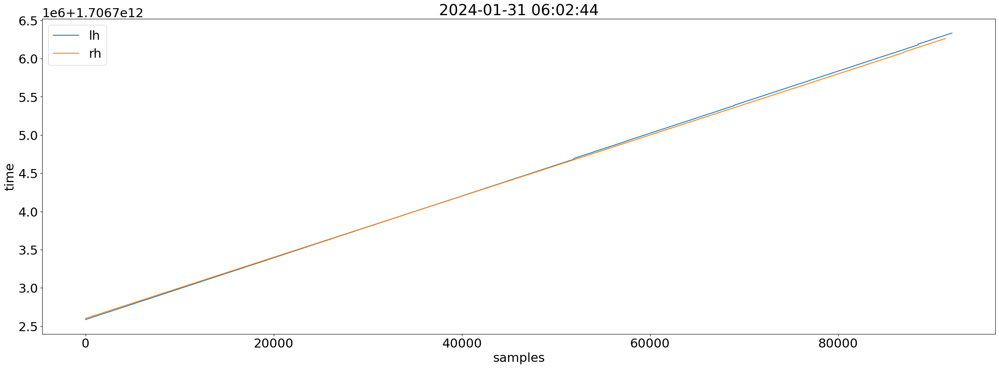

In [138]:
fig = plt.figure(figsize=(30, 10))
plt.plot(t_[2600:end], label='lh')


plt.plot(t_rh_[-lagxy:end], label=f"rh")
plt.title(f"{date_objectrh}")
plt.xlabel("samples")
plt.ylabel("time")
plt.legend()

In [137]:
t_[2600:2630]


array([1.70670258e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12, 1.70670259e+12, 1.70670259e+12,
       1.70670259e+12, 1.70670259e+12])

In [21]:
# We already have a butterfly lap saved from Orange.
# Just gonna use correlation to find the exact indices
# of fly swimming for green

In [129]:
print(f'lh:{len(exp_x)}, rh:{len(exp_xrh)}')

lh:93275, rh:93275


In [130]:
from scipy import signal

lagxy: -914


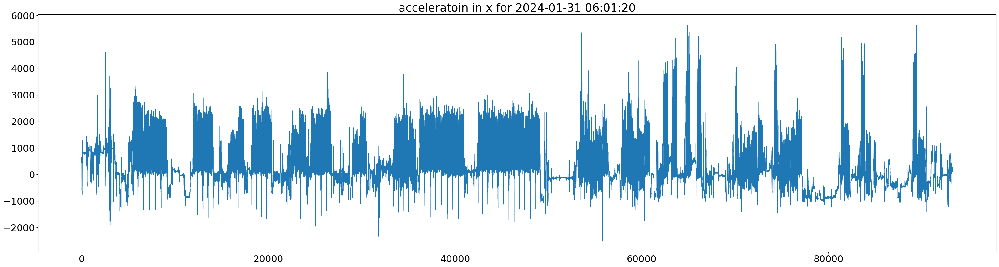

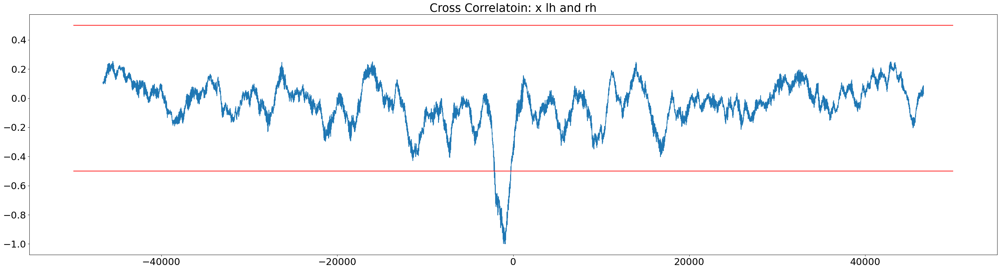

In [131]:
plt.rcParams.update({'font.size': 22})
corrx = signal.correlate((exp_x-exp_x.mean()), (exp_xrh-exp_xrh.mean()), mode="same", method="direct")
corrx = corrx /(np.max(np.abs(corrx)))
lags = signal.correlation_lags(len(exp_x), len(exp_xrh), mode="same")
lagxy = lags[np.argmax(np.abs(corrx))]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(exp_x)
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x lh and rh")
plt.plot(lags, corrx)
plt.hlines(0.5, -50000,50000,color='r')
plt.hlines(-0.5,  -50000,50000,color='r')

len of rh data:93475 and len of lh:95875
difference in length is:2400


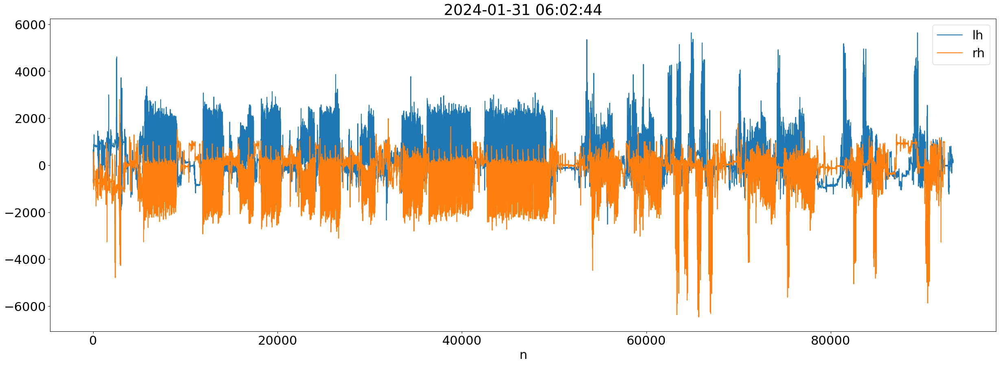

In [127]:
start = 0
end = -200
# exp_x = x[ind_diff:]
# exp_xrh = xrh[:-200]
print(f'len of rh data:{len(xrh)} and len of lh:{len(x)}')
print(f'difference in length is:{len(x)-len(xrh)}')
fig = plt.figure(figsize=(30, 10))
plt.plot(exp_x, label='lh')
# plt.title(f"lh, {date_object}")
plt.xlabel("n")
# plt.ylabel("acceleration in x")
# fig = plt.figure(figsize=(30, 10))
plt.plot(exp_xrh[-lagxy:], label=f"rh")
plt.title(f"{date_objectrh}")
plt.legend()

lagxy: 86100


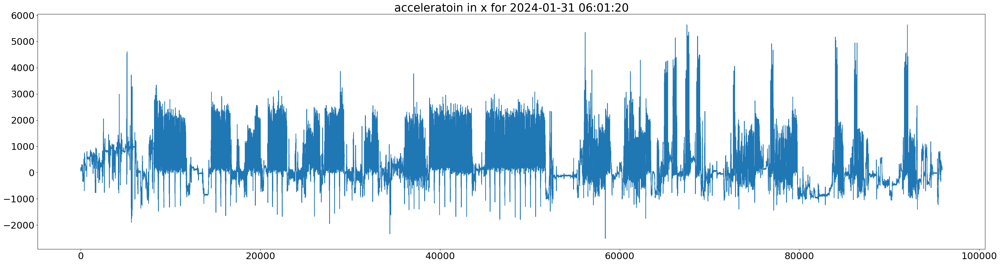

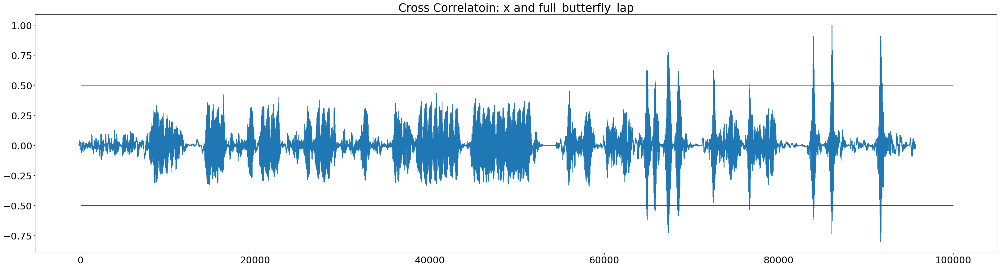

In [139]:
plt.rcParams.update({'font.size': 22})
corrx = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrx = corrx /(np.max(corrx))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrx)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x and full_butterfly_lap")
plt.plot(lags, corrx)
plt.hlines(0.5, 0,100000,color='r')
plt.hlines(-0.5, 0,100000,color='r')

In [140]:
# Finding the indices where the butterfly starts by finding where
# correlation is greater than a threshold
fly_suspect = [i for i in lags[np.where(np.abs(corrx)>0.52)]]
fly_suspect.insert(0, 0)
potential_i_fly = []
for j in range(len(fly_suspect)):
    if fly_suspect[j] - fly_suspect[j-1] > 300:
        potential_i_fly.append(fly_suspect[j])
print(f'fly detected: {len(potential_i_fly)}')

fly detected: 9


In [153]:
plt.rcParams.update({'font.size': 22})
chosen_length= 600
fly_t = np.zeros((len(potential_i_fly), chosen_length))
fly_x = np.zeros((len(potential_i_fly), chosen_length))
fly_y = np.zeros((len(potential_i_fly), chosen_length))
fly_z = np.zeros((len(potential_i_fly), chosen_length))
fly_trh = np.zeros((len(potential_i_fly), chosen_length))
fly_xrh = np.zeros((len(potential_i_fly), chosen_length))
fly_yrh = np.zeros((len(potential_i_fly), chosen_length))
fly_zrh = np.zeros((len(potential_i_fly), chosen_length))
count = 0
for i_fly in potential_i_fly:
    # fig = plt.figure(figsize=(30, 10))
    # plt.plot(x[i_fly:(i_fly+600)])
    print(f'count is {count}, {np.where(t_rh_==t_[i_fly])} and iflylh={i_fly}')
    rh_ind = np.where(t_rh_==t_[i_fly])[0][0]
    fly_trh[count, :] = t_rh_[rh_ind:(rh_ind+600)]
    fly_xrh[count, :] = xrh[rh_ind:(rh_ind+600)]
    fly_yrh[count, :] = yrh[rh_ind:(rh_ind+600)]
    fly_zrh[count, :] = zrh[rh_ind:(rh_ind+600)]
    
    fly_t[count, :] = t_[i_fly:(i_fly+600)]
    fly_x[count, :] = x[i_fly:(i_fly+600)]
    fly_y[count, :] = y[i_fly:(i_fly+600)]
    fly_z[count, :] = z[i_fly:(i_fly+600)]
    
    count += 1
    # plt.title(f"{count}th sequence  of fly")
    # plt.xlabel("n")
    # plt.ylabel("acceleration in x")

count is 0, (array([63734]),) and iflylh=64834
count is 1, (array([64714]),) and iflylh=65789
count is 2, (array([66139]),) and iflylh=67214
count is 3, (array([67370]),) and iflylh=68420
count is 4, (array([71624]),) and iflylh=72524
count is 5, (array([75810]),) and iflylh=76660
count is 6, (array([83143]),) and iflylh=83918
count is 7, (array([85258]),) and iflylh=86008
count is 8, (array([90961]),) and iflylh=91586


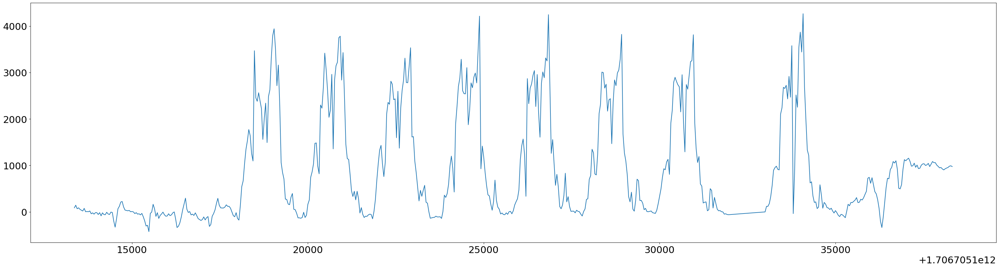

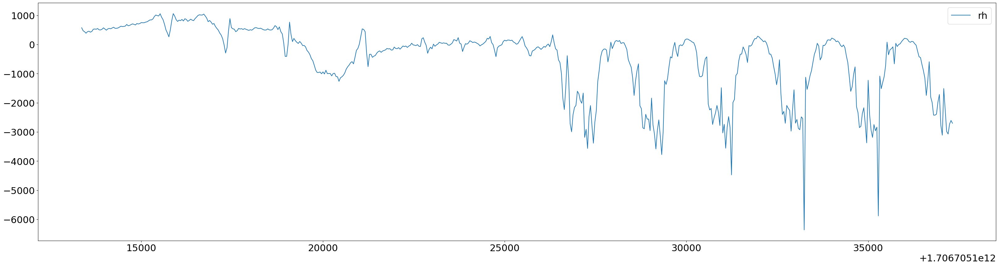

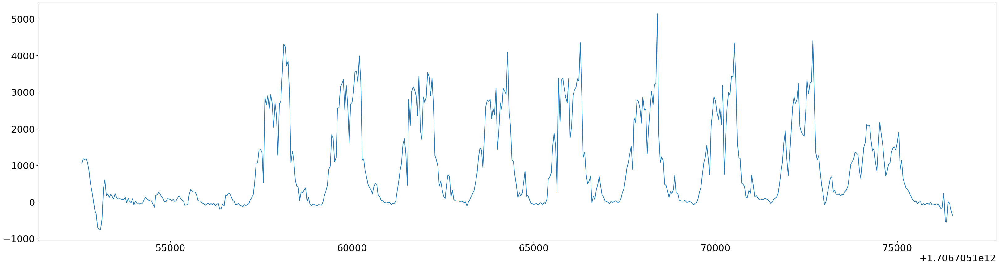

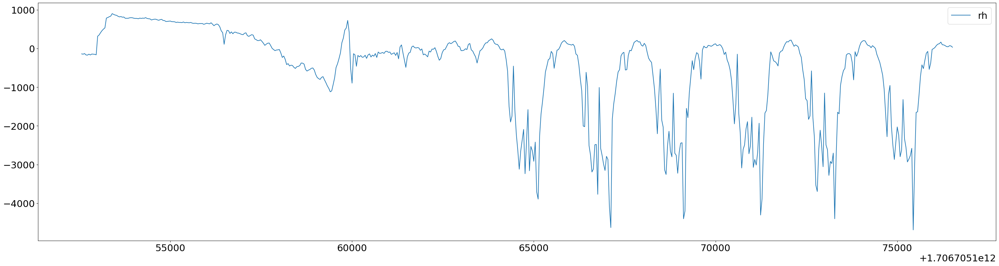

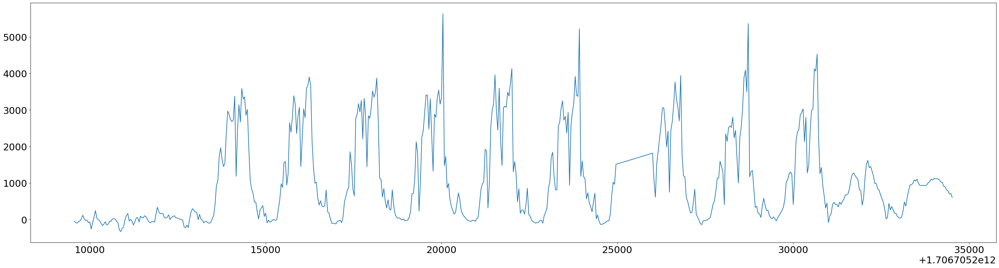

...

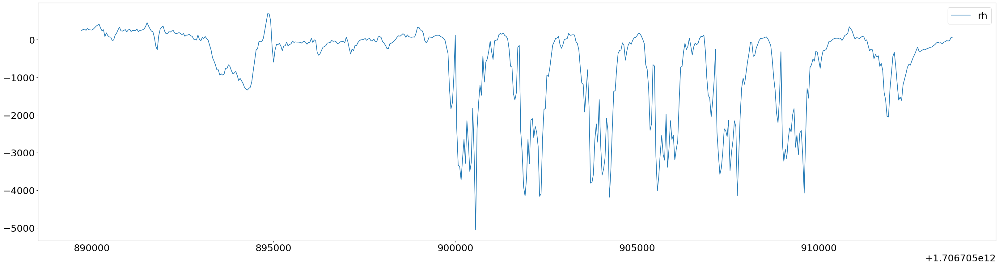

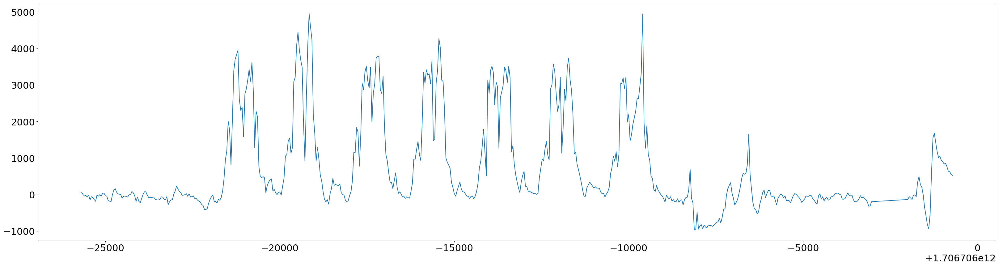

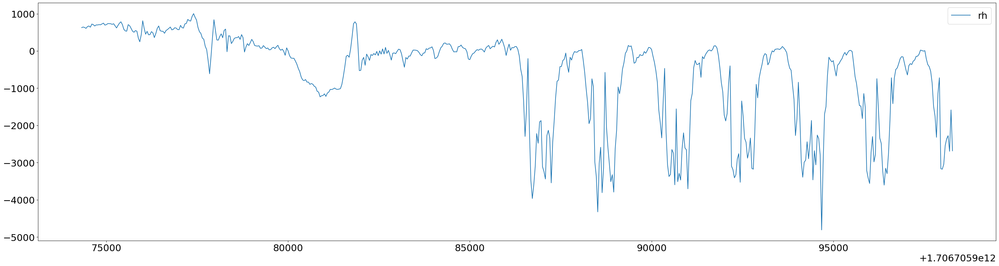

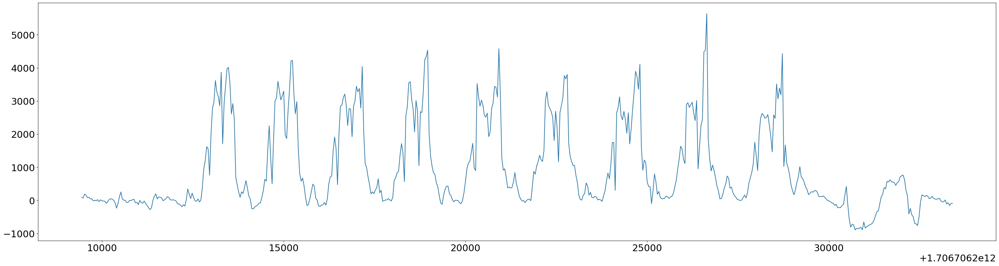

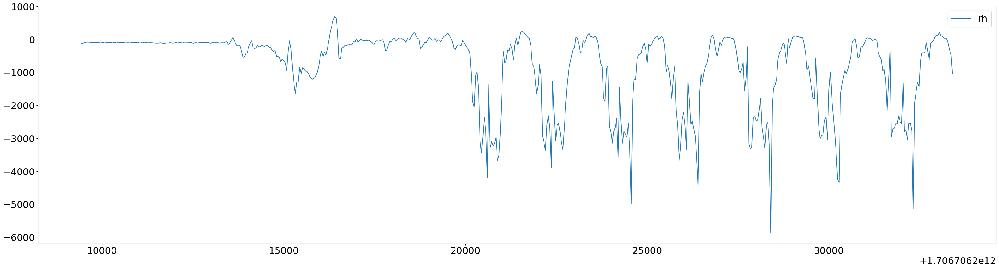

In [154]:
for k in range(len(fly_x)):
    fig = plt.figure(figsize=(40, 10))
    plt.plot(fly_t[k], fly_x[k],label="lh")
    fig = plt.figure(figsize=(40, 10))
    
    plt.plot(fly_trh[k],fly_xrh[k],label="rh")
    plt.legend()

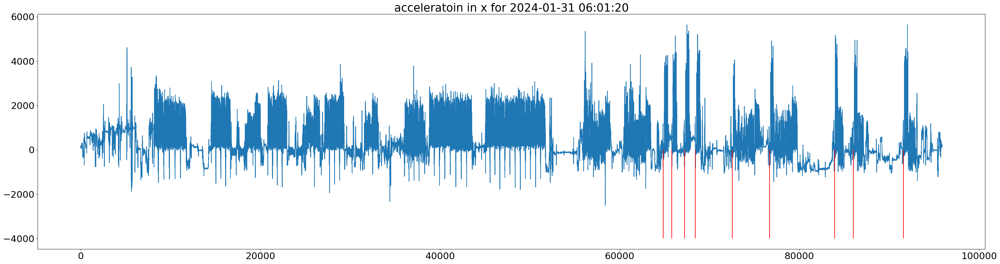

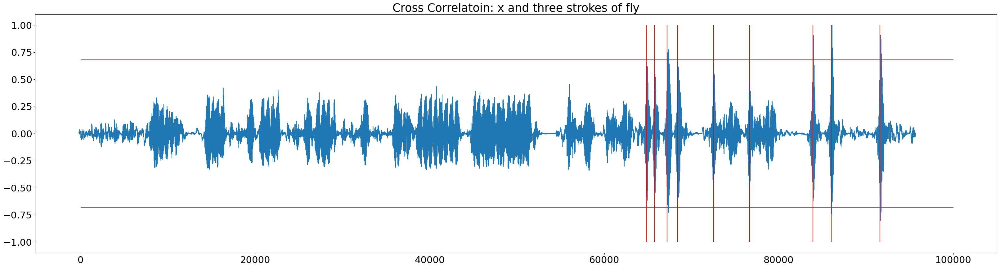

In [27]:
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
plt.vlines(potential_i_fly, 0, -4000, color='r')
plt.title(f"acceleratoin in x for {date_object}")
fig = plt.figure(figsize=(40, 10))
plt.title("Cross Correlatoin: x and three strokes of fly")
plt.plot(lags, corrx)
plt.hlines(0.68, 0,100000,color='r')
plt.hlines(-0.68, 0,100000,color='r')
plt.vlines(potential_i_fly, -1, 1, color='r')

In [ ]:
# I choose that each time you need to do three strokes for
# the model to  detect you are doing a certain style


In [28]:
# fig = plt.figure(figsize=(30, 10))
# plt.plot(fly_x[0][110:260])
# stroke_3_flyx = fly_x[0][110:260]
# plt.title("three butterfly strokes")

stroke_3_flyx = np.load("three_butterfly_strokes_x.npy")


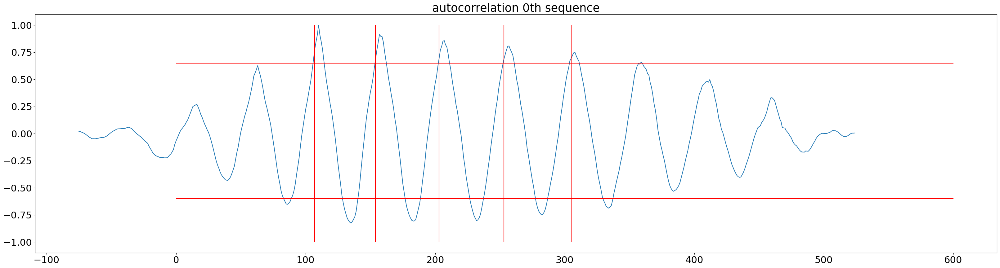

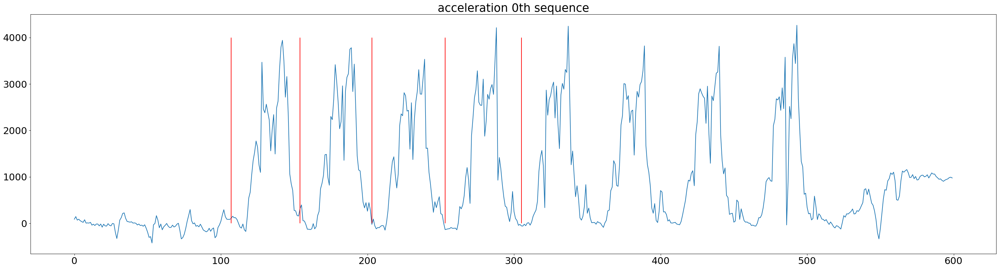

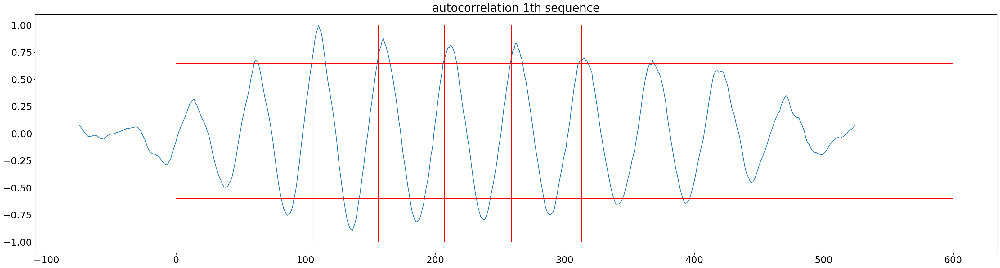

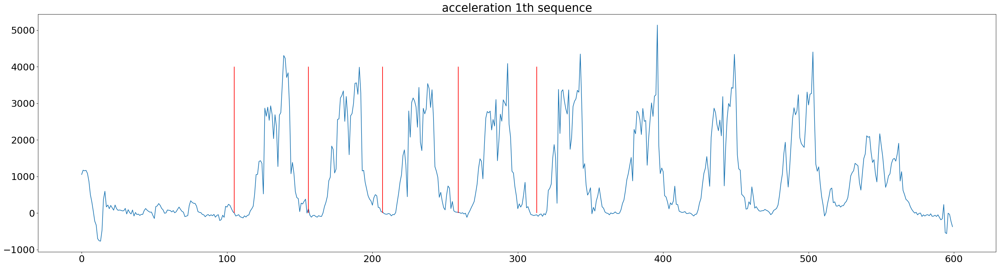

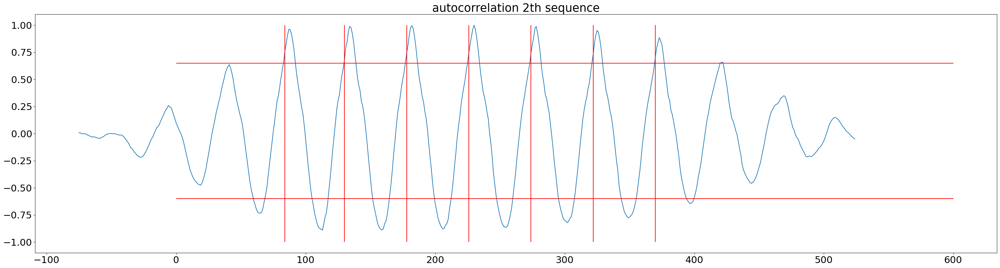

...

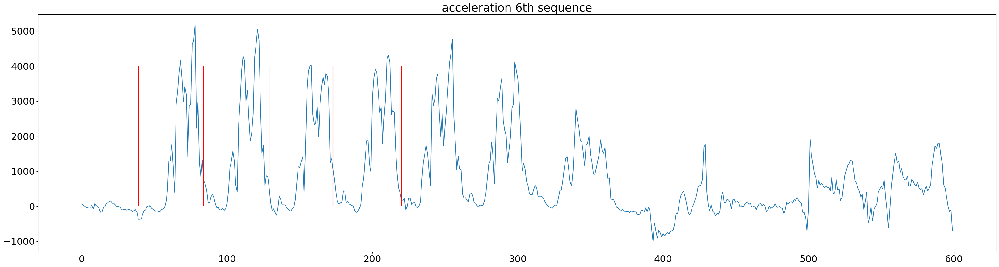

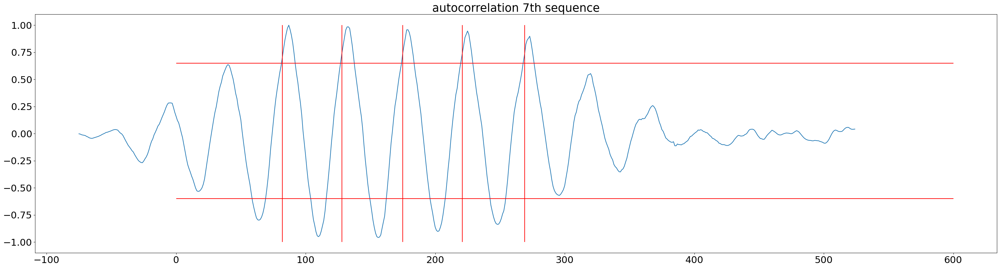

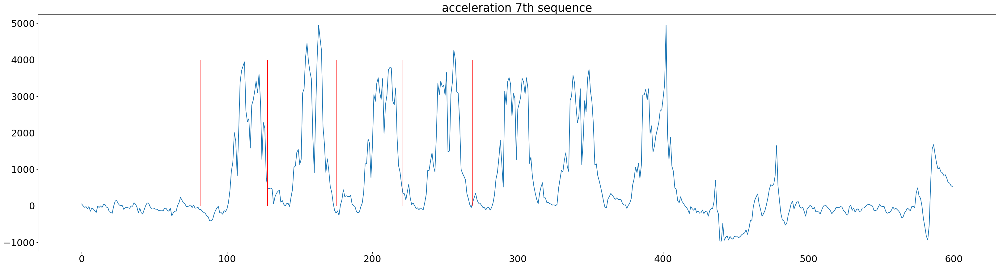

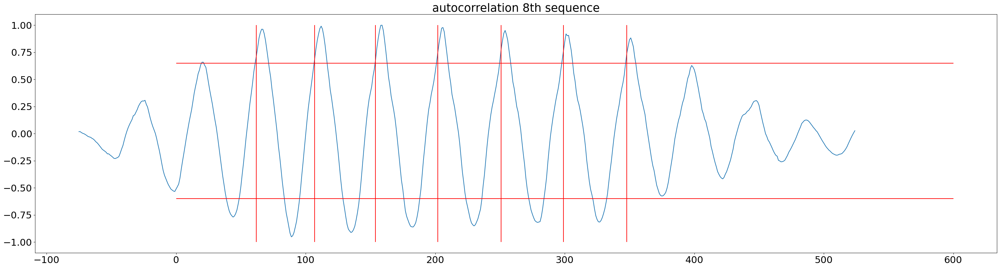

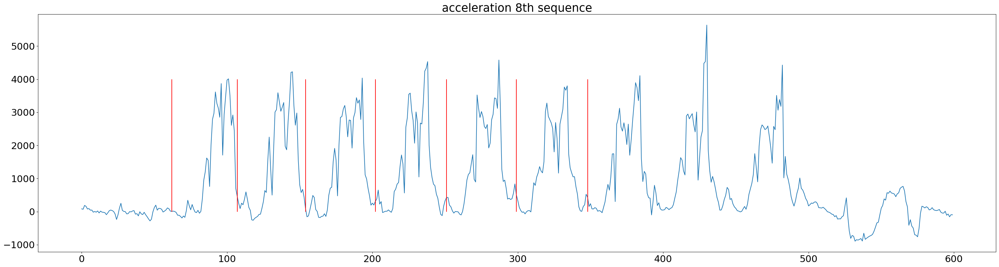

In [29]:
# trying to find the indices of 3 consecutive flys
# so that we can store them
i_fly_stroke = []
for k in range(len(fly_x)):
    temp_stroke = []
    corr_stroke = signal.correlate((fly_x[k]-fly_x[k].mean()), (stroke_3_flyx-stroke_3_flyx.mean()), mode="same", method="direct")
    corr_stroke = corr_stroke / np.max(corr_stroke)
    lags = signal.correlation_lags(len(fly_x[k]), len(stroke_3_flyx), mode="same")
    flystroke_suspect = [i for i in lags[np.where(corr_stroke>0.68)]]
    # print(f'{np.where(corr_stroke>0.70)} and {lags[np.where(corr_stroke>0.70)]} for k={k}')
    flystroke_suspect.insert(0, 0)
    for j in range(len(flystroke_suspect)):
        if flystroke_suspect[j] - flystroke_suspect[j-1] > 32:
            temp_stroke.append(flystroke_suspect[j])
    i_fly_stroke.append(temp_stroke)
    fig = plt.figure(figsize=(40, 10))
    plt.plot(lags, corr_stroke)
    plt.title(f'autocorrelation {k}th sequence')
    plt.hlines(0.65, 0,600,color='r')
    plt.hlines(-0.60, 0,600,color='r')
    plt.vlines(temp_stroke, -1, 1, color='r')
    fig = plt.figure(figsize=(40, 10))
    plt.plot(fly_x[k])
    plt.vlines(temp_stroke, 0, 4000, color='r')
    plt.title(f'acceleration {k}th sequence')

In [32]:
potential_i_fly

[64834, 65789, 67214, 68420, 72524, 76660, 83918, 86008, 91586]

In [35]:
[potential_i_fly[i] -ind_diff for i in range(len(potential_i_fly))]

[62234, 63189, 64614, 65820, 69924, 74060, 81318, 83408, 88986]

In [30]:

i_fly_stroke

[[107, 154, 203, 253, 305],
 [105, 156, 207, 259, 313],
 [84, 130, 178, 226, 274, 322, 370],
 [60, 104, 153, 204, 254, 304, 355, 407],
 [83, 130, 180],
 [59, 104, 155, 206, 260],
 [39, 84, 129, 173, 220],
 [82, 128, 175, 221, 269],
 [62, 107, 154, 202, 251, 299, 348]]

In [31]:
count = 0
for i in i_fly_stroke:
    count += len(i)
count
#how many data seq are we getting

50

In [36]:
fly_data1 = []
for k in range(len(i_fly_stroke)):
    num_strokes = len(i_fly_stroke[k])
    temp = []
    for p in range(num_strokes):
        if p < (num_strokes - 3):
            full_fly = np.stack((fly_x[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]],
                                 fly_y[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]], 
                                 fly_x[k][i_fly_stroke[k][p]:i_fly_stroke[k][p+3]]))
            #print(f'full_flyshape: {full_fly.shape}')
            full_fly = np.transpose(full_fly)
            #print(f'after: {full_fly.shape}')
            fly_data1.append(full_fly)
        else:
            if len(fly_x[k]) > (i_fly_stroke[k][p] + 150):
                full_fly = np.stack((fly_x[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)],
                                     fly_y[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)], 
                                     fly_x[k][i_fly_stroke[k][p]:(i_fly_stroke[k][p]+150)]))
                #print(f'full_flyshape: {full_fly.shape}')
                full_fly = np.transpose(full_fly)
                #print(f'after: {full_fly.shape}')
                fly_data1.append(full_fly)

In [37]:
len(fly_data1)

50

In [38]:
# 146 samples of data: (acceleration in x, acceleration in y, acceleration in z)
fly_data1[0].shape

(146, 3)

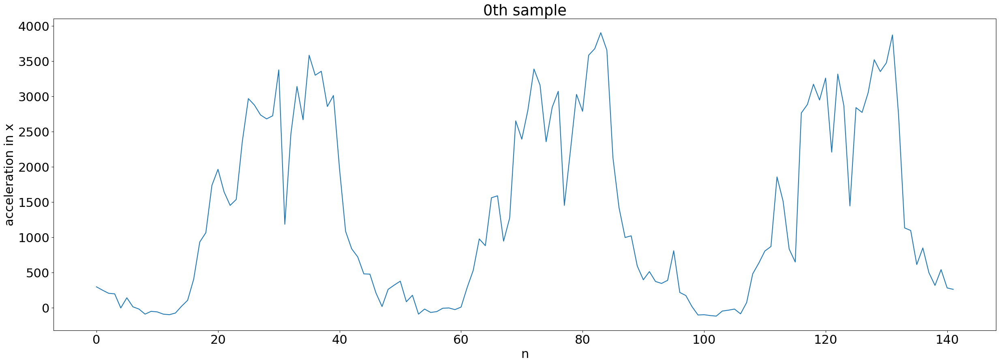

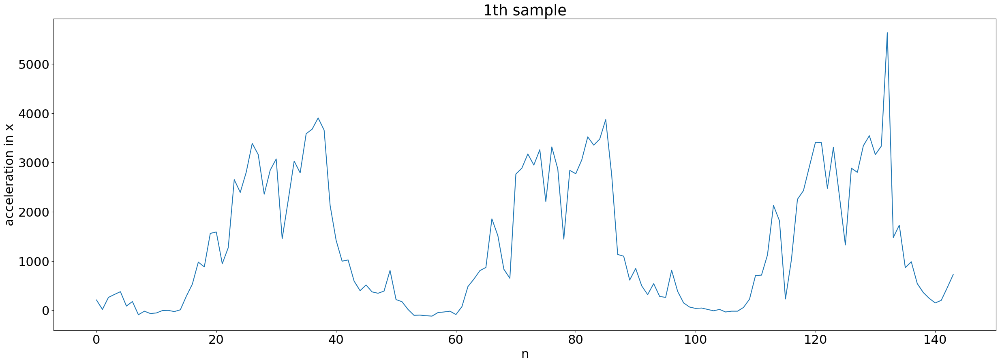

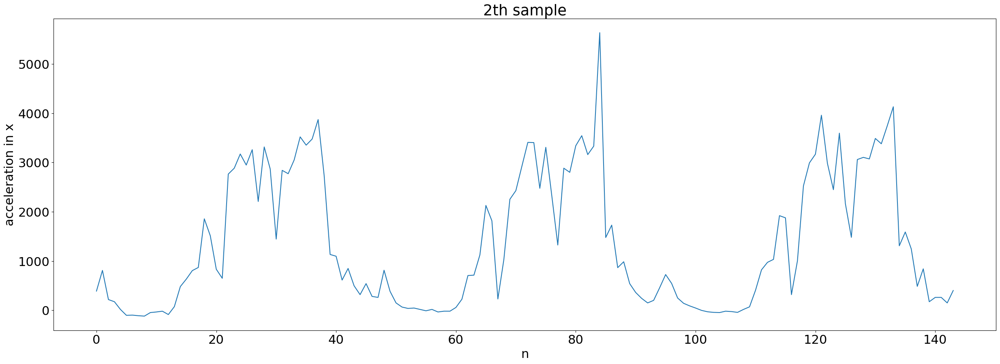

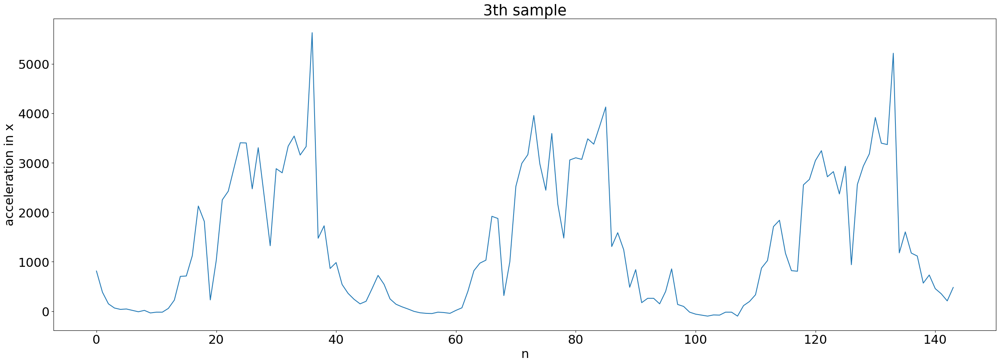

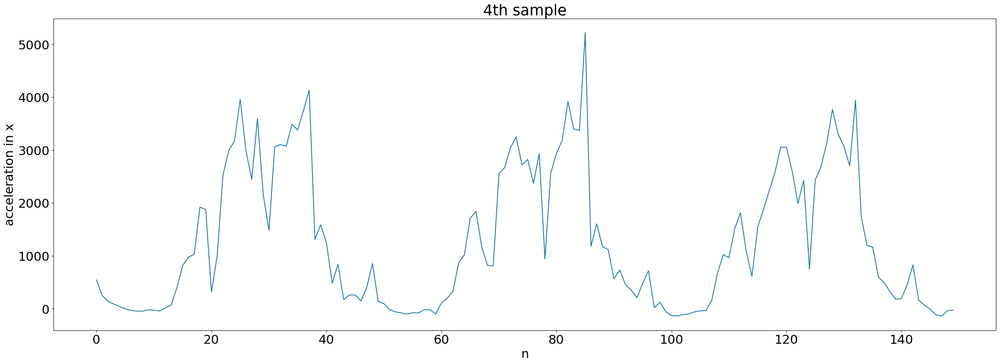

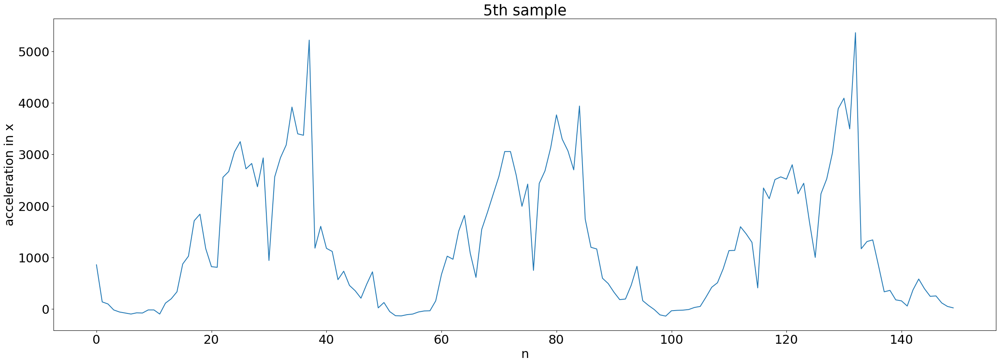

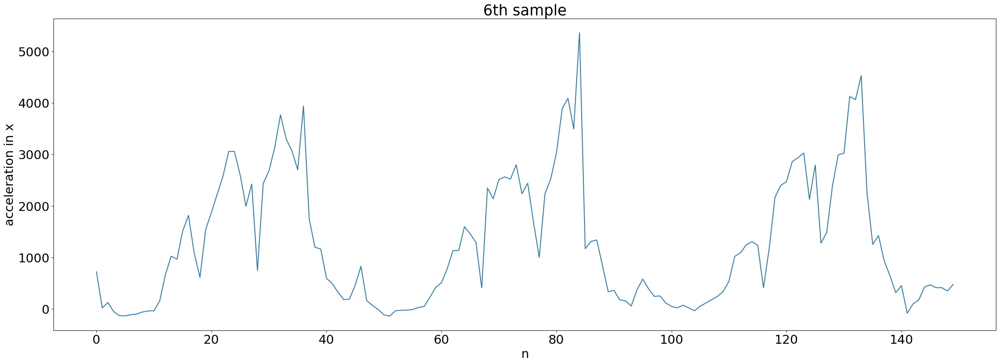

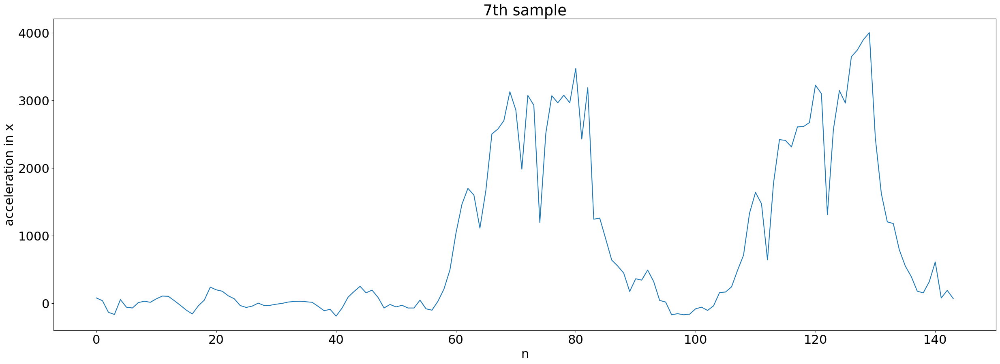

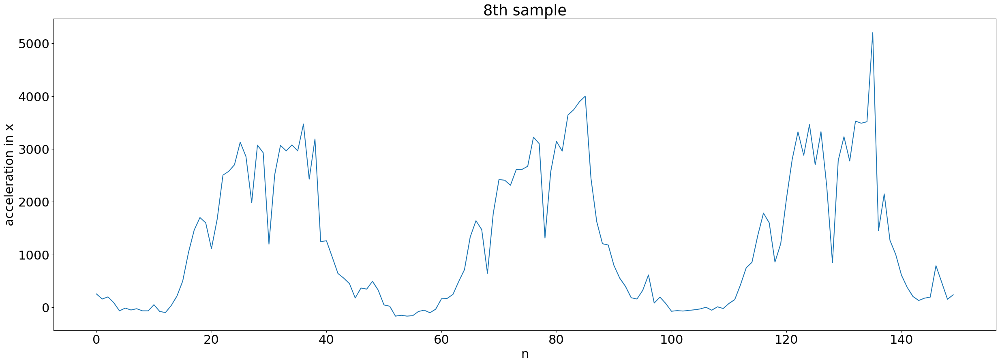

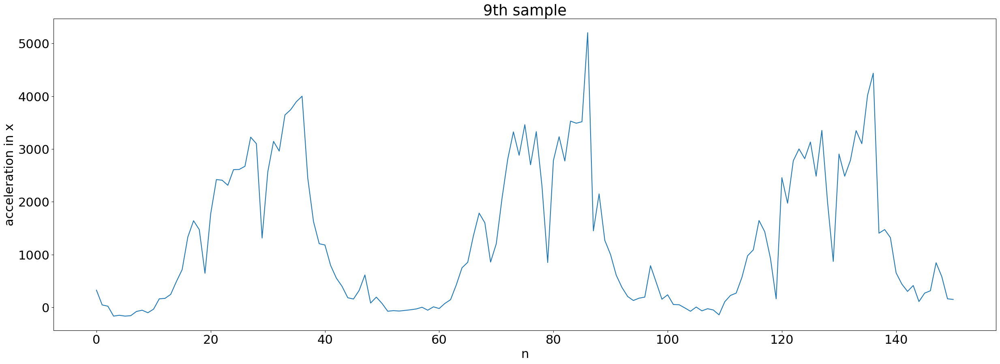

In [48]:
for i in range(10):
    plt.rcParams.update({'font.size': 22})
    fig = plt.figure(figsize=(30, 10))
    plt.plot(np.transpose(fly_data1[i+10])[0])
    plt.title(f"{i}th sample")
    plt.ylabel("acceleration in x")
    plt.xlabel("n")

In [59]:
np.savez("gree_50_fly.npz", *fly_data1)

In [40]:
old_data = np.load('gree_50_fly.npz')

In [41]:
len(old_data)

50

In [44]:
old_data.files

['arr_0',
 'arr_1',
 'arr_2',
 'arr_3',
 'arr_4',
 'arr_5',
 'arr_6',
 'arr_7',
 'arr_8',
 'arr_9',
 'arr_10',
 'arr_11',
 'arr_12',
 'arr_13',
 'arr_14',
 'arr_15',
 'arr_16',
 'arr_17',
 'arr_18',
 'arr_19',
 'arr_20',
 'arr_21',
 'arr_22',
 'arr_23',
 'arr_24',
 'arr_25',
 'arr_26',
 'arr_27',
 'arr_28',
 'arr_29',
 'arr_30',
 'arr_31',
 'arr_32',
 'arr_33',
 'arr_34',
 'arr_35',
 'arr_36',
 'arr_37',
 'arr_38',
 'arr_39',
 'arr_40',
 'arr_41',
 'arr_42',
 'arr_43',
 'arr_44',
 'arr_45',
 'arr_46',
 'arr_47',
 'arr_48',
 'arr_49']

In [47]:
(old_data['arr_2']==fly_data1[2]).all()

True